# Evaluate oof
---

In [1]:
# ===============
# libraries
# ===============
import os, gc, yaml, glob, pickle
import time
import random
import math
from pathlib import Path
from typing import Dict, List, Tuple
from types import SimpleNamespace

import numpy as np
import polars as pl
import pandas as pd
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import Image

import warnings
# warnings.filterwarnings('ignore')

# original
import sys
sys.path.append("../src")
from utils.data import sep, show_df, glob_walk, set_seed, save_config_yaml, dict_to_namespace
from utils.metric import global_weighted_r2_score, r2_per_target

from datetime import datetime
date = datetime.now().strftime("%Y%m%d")
print(f"TODAY is {date}")

TODAY is 20251230


In [19]:
# ============================
# set experimental
# ============================
EXP = "100_train_exp009"

# ===============
# Config
# ===============
exp_dir = Path("/mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction") / "experiments" / EXP

# config 読み込み
cfg_path = exp_dir / "yaml" / "config.yaml"
if not cfg_path.exists():
    raise FileNotFoundError(f"config.yaml not found: {cfg_path}")

with open(cfg_path, "r") as f:
    cfg = yaml.safe_load(f)


folds = cfg["folds"]

In [3]:
# save_path = exp_dir / f"oof_fold{fold}"
# os.makedirs(save_path, exist_ok=True)

In [4]:
# ================
# load df_folds
# ================
pp_dir = Path(cfg["pp_dir"])
data_ppdir = pp_dir / cfg["preprocess_ver"]
df_pivot = pl.read_csv(data_ppdir / "df_pivot.csv")
sep("df_pivot"); show_df(df_pivot)

df_pivot
(357, 35)


image_id,image_path,Sampling_Date,State,Species,Pre_GSHH_NDVI,Height_Ave_cm,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g,date,year,month,day,weekday,weekday_name,is_BarleyGrass,is_Barleygrass,is_Bromegrass,is_Capeweed,is_Clover,is_CrumbWeed,is_Fescue,is_Lucerne,is_Mixed,is_Phalaris,is_Ryegrass,is_SilverGrass,is_SpearGrass,is_SubcloverDalkeith,is_SubcloverLosa,is_WhiteClover,Fold
str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,str,i64,i64,i64,i64,str,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,bool,i64
"""ID1011485656""","""train/ID1011485656.jpg""","""2015/9/4""","""Tas""","""Ryegrass_Clover""",0.62,4.6667,0.0,31.9984,16.2751,48.2735,16.275,"""2015-09-04""",2015,9,4,5,"""Fri""",false,false,false,false,true,false,false,false,false,false,true,false,false,false,false,false,4
"""ID1012260530""","""train/ID1012260530.jpg""","""2015/4/1""","""NSW""","""Lucerne""",0.55,16.0,0.0,0.0,7.6,7.6,7.6,"""2015-04-01""",2015,4,1,3,"""Wed""",false,false,false,false,false,false,false,true,false,false,false,false,false,false,false,false,1
"""ID1025234388""","""train/ID1025234388.jpg""","""2015/9/1""","""WA""","""SubcloverDalkeith""",0.38,1.0,6.05,0.0,0.0,6.05,6.05,"""2015-09-01""",2015,9,1,2,"""Tue""",false,false,false,false,false,false,false,false,false,false,false,false,false,true,false,false,2


In [48]:
# ==========================
# OOF 読み込み
# ==========================
ids = []
folds = []
N = 0

for i, fold in enumerate(cfg["folds"]):
    oof_path = exp_dir / "oof" / f"oof_fold{fold}.npz"
    if not oof_path.exists():
        raise FileNotFoundError(f"OOF file not found: {oof_path}")

    oof = np.load(oof_path)
    _ids = oof["ids"]        # (N,)
    _folds = [i] * len(_ids)
    _preds = oof["preds"]    # (N,F)
    _targets = oof["targets"]  # (N,F)
    _preds_log = oof["preds_log"]  # (N,F)
    _targs_log = oof["targets_log"]  # (N,F)

    target_cols = cfg["target_cols"]

    N += len(_ids)
    if N == 0:
        print(f"[WARN] OOF is empty at {oof_path}")
        
    print(f"[INFO] Loaded OOF: {oof_path}")
    print(f"[INFO] N samples: {N}")

    ids.extend(_ids)
    folds.extend(_folds)
    if i ==0:
        preds = _preds
        targets = _targets
        preds_log = _preds_log
        targs_log = _targs_log
    else:
        preds = np.concatenate((preds, _preds), axis=0)
        targets = np.concatenate((targets, _targets), axis=0)
        preds_log = np.concatenate((preds_log, _preds_log), axis=0)
        targs_log = np.concatenate((targs_log, _targs_log), axis=0)
ids = np.array(ids)
folds = np.array(folds)

[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/100_train_exp009/oof/oof_fold0.npz
[INFO] N samples: 61
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/100_train_exp009/oof/oof_fold1.npz
[INFO] N samples: 147
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/100_train_exp009/oof/oof_fold2.npz
[INFO] N samples: 235
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/100_train_exp009/oof/oof_fold3.npz
[INFO] N samples: 295
[INFO] Loaded OOF: /mnt/nfs/home/hidebu/study/CSIRO---Image2Biomass-Prediction/experiments/100_train_exp009/oof/oof_fold4.npz
[INFO] N samples: 357


In [49]:
# compute weighted_r2_score
score = global_weighted_r2_score(targets, preds, cfg["metric"]["weights"])
print(f"[INFO] Weighted R2 Score: {score:.4f}")

[INFO] Weighted R2 Score: 0.6887


In [7]:
preds_fix = preds.copy()
preds_fix[:, 3] = preds_fix[:, 0] + preds_fix[:, 1]              # GDM = Green + Clover
preds_fix[:, 4] = preds_fix[:, 0] + preds_fix[:, 1] + preds_fix[:, 2]  # Total = Green + Clover + Dead

r2_before = global_weighted_r2_score(targets, preds, cfg["metric"]["weights"])
r2_after  = global_weighted_r2_score(targets, preds_fix, cfg["metric"]["weights"])
print("before:", r2_before, "after:", r2_after)

before: 0.6292685739195614 after: 0.5496981300662351


In [52]:
pred_df = pl.DataFrame(
    {
        "image_id": ids,
        "fold": folds,
        "preds_Dry_Green_g": preds[:, 0],
        "preds_Dry_Clover_g": preds[:, 1],
        "preds_Dry_Dead_g": preds[:, 2],
        "preds_GDM_g": preds[:, 3],
        "preds_Dry_Total_g": preds[:, 4],
        "targets_Dry_Green_g": targets[:, 0],
        "targets_Dry_Clover_g": targets[:, 1],
        "targets_Dry_Dead_g": targets[:, 2],
        "targets_GDM_g": targets[:, 3],
        "targets_Dry_Total_g": targets[:, 4],
        "preds_log_Dry_Green_g": preds_log[:, 0],
        "preds_log_Dry_Clover_g": preds_log[:, 1],
        "preds_log_Dry_Dead_g": preds_log[:, 2],
        "preds_log_GDM_g": preds_log[:, 3],
        "preds_log_Dry_Total_g": preds_log[:, 4],
        "targets_log_Dry_Green_g": targs_log[:, 0],
        "targets_log_Dry_Clover_g": targs_log[:, 1],
        "targets_log_Dry_Dead_g": targs_log[:, 2],
        "targets_log_GDM_g": targs_log[:, 3],
        "targets_log_Dry_Total_g": targs_log[:, 4],
    }
)
show_df(pred_df)

(357, 22)


image_id,fold,preds_Dry_Green_g,preds_Dry_Clover_g,preds_Dry_Dead_g,preds_GDM_g,preds_Dry_Total_g,targets_Dry_Green_g,targets_Dry_Clover_g,targets_Dry_Dead_g,targets_GDM_g,targets_Dry_Total_g,preds_log_Dry_Green_g,preds_log_Dry_Clover_g,preds_log_Dry_Dead_g,preds_log_GDM_g,preds_log_Dry_Total_g,targets_log_Dry_Green_g,targets_log_Dry_Clover_g,targets_log_Dry_Dead_g,targets_log_GDM_g,targets_log_Dry_Total_g
str,i64,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32,f32
"""ID1035947949""",0,6.819656,1.398875,12.940045,9.040638,25.609013,10.526099,0.4343,23.223902,10.960501,34.184395,2.056641,0.875,2.634766,2.306641,3.28125,2.444614,0.360677,3.18734,2.48161,3.560603
"""ID105271783""",0,37.041279,1.131521,6.317248,33.569393,45.700272,27.666702,5.2698,8.563501,32.936497,41.5,3.638672,0.756836,1.990234,3.542969,3.84375,3.355736,1.835745,2.257954,3.524491,3.749504
"""ID1103883611""",0,43.911213,1.120103,25.401939,56.218369,84.560074,82.783417,0.0,12.9166,82.783417,95.699989,3.8046875,0.751465,3.2734375,4.046875,4.449219,4.428235,0.0,2.633082,4.428235,4.571613


In [53]:
import numpy as np
import matplotlib.pyplot as plt
from typing import List

def plot_scatter_grid(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    target_cols: List[str],
    nrows: int = 2,
    ncols: int = 3,
) -> None:
    """ターゲット別散布図（log1p空間）を 2x3 で可視化する。"""
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 4), squeeze=False)
    axes_flat = axes.ravel()

    for j, t in enumerate(target_cols):
        ax = axes_flat[j]

        yt = y_true[:, j]
        yp = y_pred[:, j]

        # heavy tail 対策で log1p 空間で可視化
        x = np.log1p(np.clip(yt, 0, None))
        y = np.log1p(np.clip(yp, 0, None))

        ax.scatter(x, y, s=10, alpha=0.6)

        # y=x の線（このsubplot内での範囲に合わせる）
        mn = float(min(x.min(), y.min()))
        mx = float(max(x.max(), y.max()))
        ax.plot([mn, mx], [mn, mx])

        ax.set_title(f"OOF scatter (log1p): {t}")
        ax.set_xlabel("log1p(true)")
        ax.set_ylabel("log1p(pred)")
        ax.grid(True, alpha=0.2)

    # 余った枠を消す（5ターゲットなら最後の1枠）
    for k in range(len(target_cols), nrows * ncols):
        fig.delaxes(axes_flat[k])

    fig.tight_layout()
    plt.show()

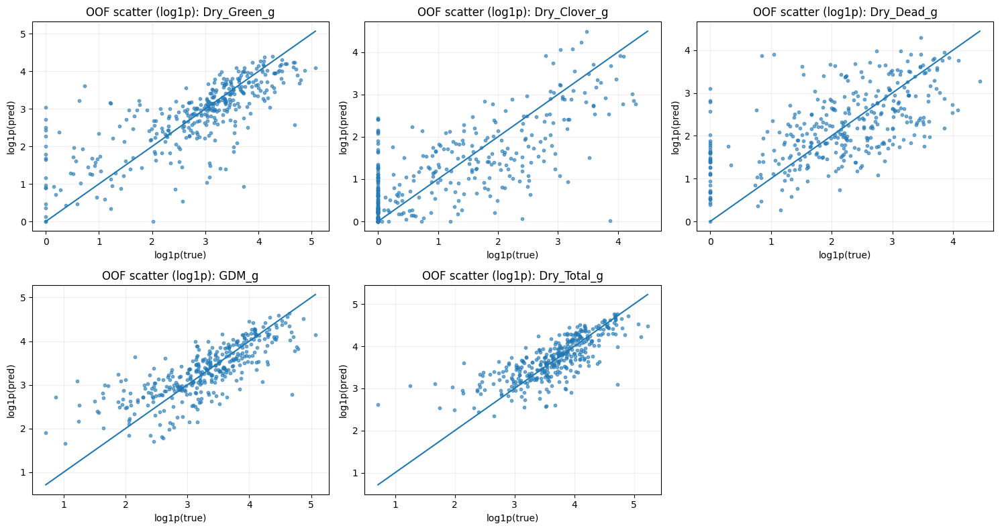

In [54]:
plot_scatter_grid(
    y_true=targets,
    y_pred=preds,
    target_cols=target_cols,
    nrows= 2,
    ncols = 3
    )


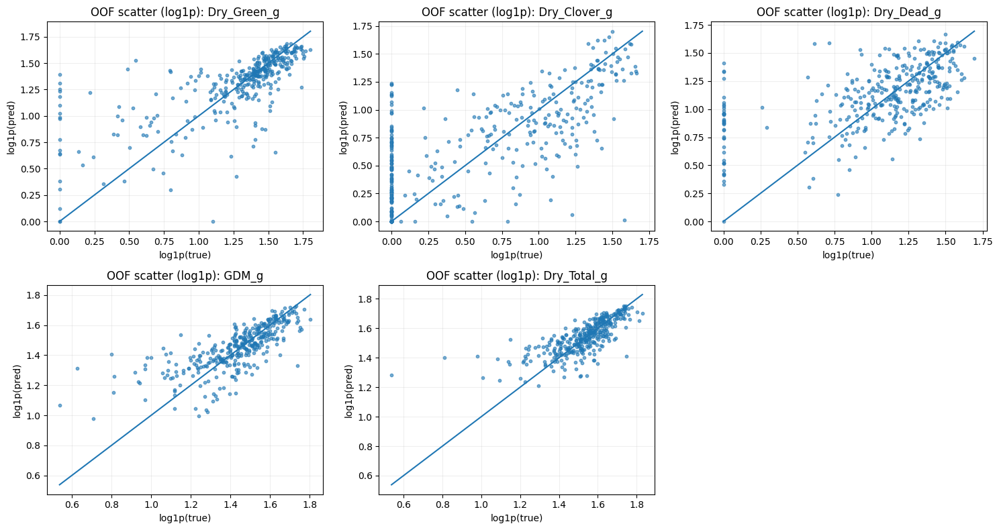

In [55]:
plot_scatter_grid(
    y_true=targs_log,
    y_pred=preds_log,
    target_cols=target_cols,
    nrows= 2,
    ncols = 3
    )


In [65]:
def build_image_score_df(
    ids: np.ndarray,
    targets: np.ndarray,
    preds: np.ndarray,
    weights: List[float],
    df_pivot_pl: pl.DataFrame,
) -> pd.DataFrame:
    """OOFから画像単位の診断スコア（r2_i）を計算してDataFrameにする。

    Notes:
        公式 global weighted R² と整合する平均との差 mu を使い、
        画像ごとの r2_i = 1 - SSE_i/SST_i を計算する（分析用）。

    Returns:
        pd.DataFrame:
            image_id, row_idx, r2_img, sse, sst, image_path, State, Sampling_Date, ...
    """
    weights = np.asarray(weights, dtype=np.float64)
    n = targets.shape[0]
    k = targets.shape[1]

    # 公式globalと整合する weighted mean（単一のmu）
    mu = np.sum(targets * weights[None, :]) / (n * np.sum(weights))

    # 画像ごとの SSE / SST
    sse = np.sum(weights[None, :] * (targets - preds) ** 2, axis=1)
    sst = np.sum(weights[None, :] * (targets - mu) ** 2, axis=1)

    r2_img = np.where(sst > 0, 1.0 - sse / sst, np.nan)

    score_df = pd.DataFrame(
        {
            "image_id": ids.astype(str),
            "fold": folds.astype(int),
            "row_idx": np.arange(n, dtype=np.int64),
            "r2_img": r2_img.astype(np.float64),
            "sse": sse.astype(np.float64),
            "sst": sst.astype(np.float64),
        }
    )

    # メタ情報（image_pathなど）をjoin
    meta_cols = [c for c in ["image_id", "image_path", "State", "Sampling_Date"] if c in df_pivot_pl.columns]
    meta_pd = df_pivot_pl.select(meta_cols).to_pandas()

    score_df = score_df.merge(meta_pd, on="image_id", how="left")
    score_df["label"] = score_df.apply(lambda r: f"{r['image_id']} | r2={r['r2_img']:.3f}", axis=1)
    return score_df


weights = cfg["metric"]["weights"]
score_df = build_image_score_df(ids, targets, preds, weights, df_pivot)
score_df.sort_values("r2_img", ascending=False).head(10)

,image_id,fold,row_idx,r2_img,sse,sst,image_path,State,Sampling_Date,label
68,ID1140993511,1,68,0.998152,0.572859,309.915810,train/ID1140993511.jpg,Vic,2015/8/14,ID1140993511 | r2=0.998
121,ID471758347,1,121,0.995062,1.142512,231.355268,train/ID471758347.jpg,Vic,2015/8/14,ID471758347 | r2=0.995
308,ID1403078396,4,308,0.994902,2.923203,573.369052,train/ID1403078396.jpg,Tas,2015/9/4,ID1403078396 | r2=0.995
32,ID2056023629,0,32,0.994606,8.040179,1490.591639,train/ID2056023629.jpg,NSW,2015/2/25,ID2056023629 | r2=0.995
265,ID2003438517,3,265,0.994373,1.998223,355.134041,train/ID2003438517.jpg,Vic,2015/7/2,ID2003438517 | r2=0.994
291,ID885388135,3,291,0.994227,1.719275,297.803446,train/ID885388135.jpg,Vic,2015/7/2,ID885388135 | r2=0.994
77,ID141370843,1,77,0.993419,1.306126,198.480850,train/ID141370843.jpg,Vic,2015/8/14,ID141370843 | r2=0.993
190,ID196516535,2,190,0.990435,2.859874,299.000427,train/ID196516535.jpg,Tas,2015/5/18,ID196516535 | r2=0.990
99,ID1746343319,1,99,0.989542,3.993731,381.892313,train/ID1746343319.jpg,Tas,2015/11/9,ID1746343319 | r2=0.990
351,ID846154859,4,351,0.989303,3.172742,296.599169,train/ID846154859.jpg,Tas,2015/9/4,ID846154859 | r2=0.989


In [66]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

def plot_image_and_bars_grid(
    subset_df: pd.DataFrame,
    preds: np.ndarray,
    targets: np.ndarray,
    target_cols: List[str],
    input_dir: str,
    title_prefix: str,
    use_log1p_y: bool = False,
) -> None:
    """Nx2（左=画像、右=target/pred棒グラフ）で可視化する。

    Args:
        subset_df: score_df の部分集合（row_idx を含む必要あり）
        preds, targets: (N,K)
        target_cols: ターゲット名（K個）
        input_dir: raw データroot（画像パスのroot）
        title_prefix: "TOP" / "WORST" など
        use_log1p_y: 棒グラフのyをlog1pで描く（スケール差が大きいときに便利）
    """
    n = len(subset_df)
    if n == 0:
        print("[WARN] subset_df is empty.")
        return

    fig, axes = plt.subplots(n, 2, figsize=(14, 4 * n), squeeze=False)

    x = np.arange(len(target_cols))
    width = 0.35

    for i, row in enumerate(subset_df.itertuples(index=False)):
        idx = int(row.row_idx)
        image_id = str(row.image_id)
        r2_img = float(row.r2_img)
        sse = float(row.sse)
        fold = int(row.fold)

        # --- 左: 画像 ---
        ax_img = axes[i, 0]
        img_path = Path(input_dir) / str(row.image_path)
        img = Image.open(img_path).convert("RGB")
        ax_img.imshow(img)
        ax_img.axis("off")
        ax_img.set_title(f"{title_prefix}{i+1}: {image_id} Fold{fold}| r2={r2_img:.3f}")

        # --- 右: 棒グラフ ---
        ax_bar = axes[i, 1]
        y_true = targets[idx].copy()
        y_pred = preds[idx].copy()

        # 見やすさのため、任意でlog1pに変換
        if use_log1p_y:
            y_true_plot = np.log1p(np.clip(y_true, 0, None))
            y_pred_plot = np.log1p(np.clip(y_pred, 0, None))
            ax_bar.set_ylabel("log1p(g)")
        else:
            y_true_plot = y_true
            y_pred_plot = y_pred
            ax_bar.set_ylabel("g")

        ax_bar.bar(x - width / 2, y_true_plot, width, label="target")
        ax_bar.bar(x + width / 2, y_pred_plot, width, label="pred")

        ax_bar.set_xticks(x)
        ax_bar.set_xticklabels(target_cols, rotation=45, ha="right")
        ax_bar.grid(True, axis="y", alpha=0.25)
        ax_bar.legend()

        # SSEも軽く表示（診断用）
        ax_bar.set_title(f"SSE(w)={sse:.2f}")

    fig.tight_layout()
    plt.show()

In [67]:
TOP_N = 8
WORST_N = 8

rank_df = score_df.dropna(subset=["r2_img"]).sort_values("r2_img", ascending=False)

top_df = rank_df.head(TOP_N)
worst_df = rank_df.sort_values("r2_img", ascending=True).head(WORST_N)

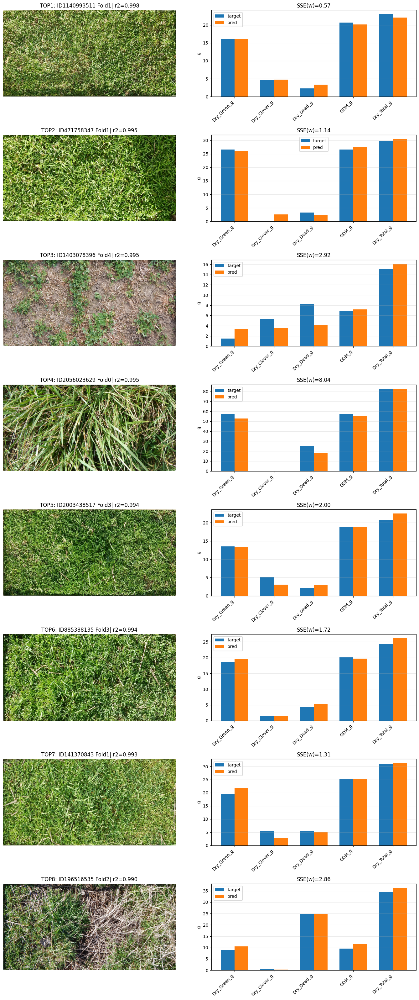

In [68]:
plot_image_and_bars_grid(
    subset_df=top_df,
    preds=preds,
    targets=targets,
    target_cols=target_cols,
    input_dir=cfg["input_dir"],
    title_prefix="TOP",
    use_log1p_y=False,   # Trueにするとスケール差が見やすい
)

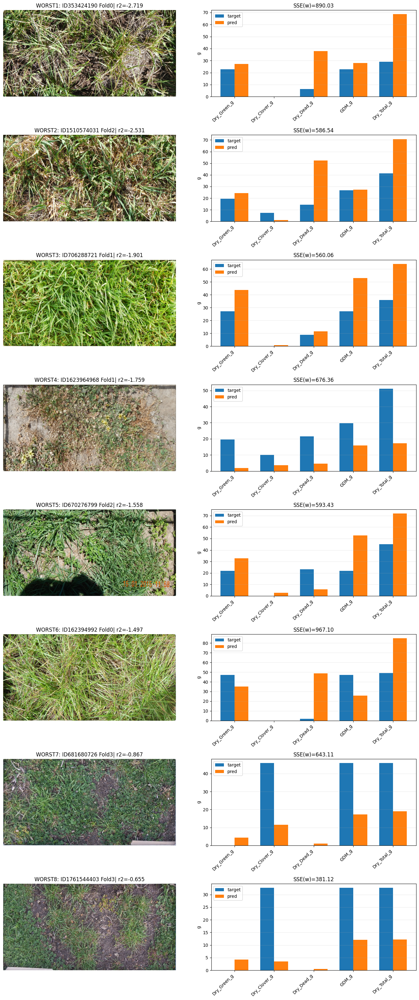

In [69]:
plot_image_and_bars_grid(
    subset_df=worst_df,
    preds=preds,
    targets=targets,
    target_cols=target_cols,
    input_dir=cfg["input_dir"],
    title_prefix="WORST",
    use_log1p_y=False,
)

✅ merged df shape: (61, 18)


,image_id,pred_Dry_Green_g,true_Dry_Green_g,err_Dry_Green_g,pred_Dry_Clover_g,true_Dry_Clover_g,err_Dry_Clover_g,pred_Dry_Dead_g,true_Dry_Dead_g,err_Dry_Dead_g,pred_GDM_g,true_GDM_g,err_GDM_g,pred_Dry_Total_g,true_Dry_Total_g,err_Dry_Total_g,State,Sampling_Date
0,ID1035947949,6.819656,10.526099,-3.706443,1.398875,0.4343,0.964575,12.940045,23.223902,-10.283856,9.040638,10.960501,-1.919863,25.609013,34.184395,-8.575382,Tas,2015/9/11
1,ID105271783,37.041279,27.666702,9.374577,1.131521,5.2698,-4.138279,6.317248,8.563501,-2.246253,33.569393,32.936497,0.632896,45.700272,41.500000,4.200272,Vic,2015/6/30
2,ID1103883611,43.911213,82.783417,-38.872204,1.120103,0.0000,1.120103,25.401939,12.916600,12.485339,56.218369,82.783417,-26.565048,84.560074,95.699989,-11.139915,NSW,2015/2/24


📌 State別 global_weighted_r2（悪い順）


,State,n,global_weighted_r2
2,Vic,17,0.324650
0,NSW,35,0.520897
1,Tas,9,0.580354


📌 State×target の wSSE（大きいほど悪い）


,State,target,n,SSE,wSSE,RMSE,MAE,weight
4,NSW,Dry_Total_g,35,34007.607843,17003.803921,31.171236,20.872346,0.5
3,NSW,GDM_g,35,39196.983818,7839.396764,33.465114,25.609027,0.2
0,NSW,Dry_Green_g,35,46984.479772,4698.447977,36.638964,28.458261,0.1
14,Vic,Dry_Total_g,17,4681.204021,2340.602010,16.594124,13.849488,0.5
2,NSW,Dry_Dead_g,35,15403.610122,1540.361012,20.978635,17.117415,0.1
9,Tas,Dry_Total_g,9,1252.785824,626.392912,11.798238,10.725678,0.5
12,Vic,Dry_Dead_g,17,3165.886090,316.588609,13.646560,11.020594,0.1
13,Vic,GDM_g,17,882.499173,176.499835,7.204979,6.348544,0.2
8,Tas,GDM_g,9,626.643831,125.328766,8.344285,6.906338,0.2
10,Vic,Dry_Green_g,17,487.630431,48.763043,5.355758,4.610571,0.1


📌 State別（ターゲット別）wSSE のピボット


target,Dry_Clover_g,Dry_Dead_g,Dry_Green_g,Dry_Total_g,GDM_g
State,,,,,
NSW,2.912630,1540.361012,4698.447977,17003.803921,7839.396764
Tas,3.106033,42.261120,43.570065,626.392912,125.328766
Vic,38.619635,316.588609,48.763043,2340.602010,176.499835


📌 true_total bin別の誤差（小→大）


,bin,n,true_total_mean,true_total_median,pred_total_mean,MAE_total,RMSE_total,mean_weighted_sse_img,global_weighted_r2_in_bin
0,"(15.509, 34.174]",11,28.008291,29.702396,29.165135,14.158021,17.158784,175.491094,-0.487428
1,"(34.174, 41.6]",10,38.277219,38.600002,34.583183,9.393379,11.906534,99.272798,0.399088
2,"(41.6, 56.4]",10,49.280093,48.550453,52.085448,17.690677,20.827285,323.087106,-0.017758
3,"(56.4, 80.2]",9,64.219341,64.799995,65.244837,12.743901,15.041730,273.540697,0.476268
4,"(80.2, 105.5]",11,93.809092,94.799988,84.634546,11.702993,14.464040,307.218574,0.735654
5,"(105.5, 185.7]",10,127.210001,115.400013,89.261843,39.249771,51.584829,2285.138267,0.107868


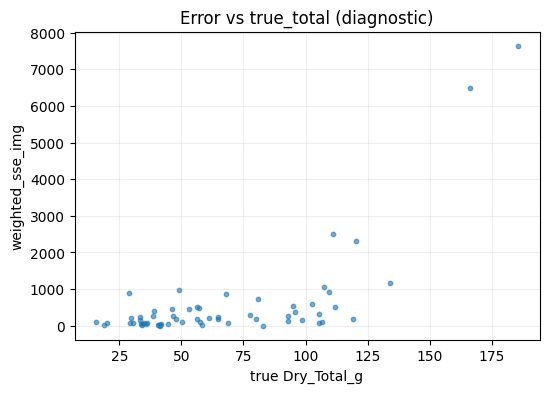

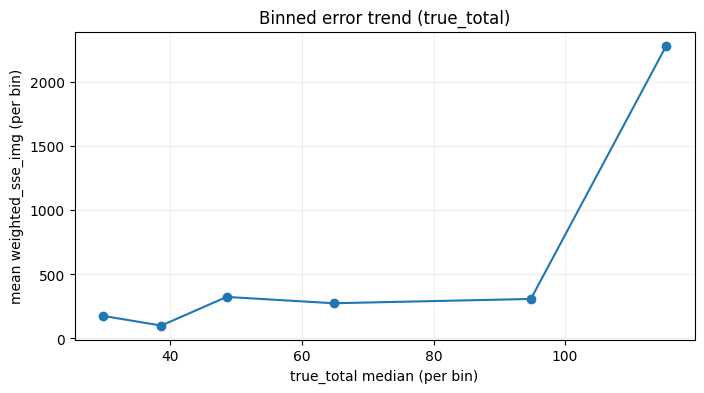

In [17]:
# ============================================================
# 📌 OOF分析：State別 / Total bin別 の誤差を診断する
# ============================================================
from __future__ import annotations
from typing import Dict, List, Tuple, Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# あなたの utils に合わせて import（存在しない場合は下のfallbackが動きます）
try:
    from utils.metric import global_weighted_r2_score, r2_per_target
except Exception:
    # --- fallback（念のため）---
    def global_weighted_r2_score(y_true: np.ndarray, y_pred: np.ndarray, weights: np.ndarray) -> float:
        """公式の 'global weighted R²' 相当（全(target,row)をまとめてR²）。"""
        y_true = np.asarray(y_true, dtype=np.float64)
        y_pred = np.asarray(y_pred, dtype=np.float64)
        w = np.asarray(weights, dtype=np.float64)

        # (N,K) -> (N*K,)
        yt = y_true.reshape(-1)
        yp = y_pred.reshape(-1)

        # rowごとにweightを当てる（targetごとの重みを繰り返す）
        ww = np.tile(w, (y_true.shape[0],)).reshape(-1)

        # weighted SSE / SST
        sse = np.sum(ww * (yt - yp) ** 2)
        mu = np.sum(ww * yt) / np.sum(ww)
        sst = np.sum(ww * (yt - mu) ** 2)
        return float(1.0 - sse / sst) if sst > 0 else 0.0

    def r2_per_target(y_true: np.ndarray, y_pred: np.ndarray) -> np.ndarray:
        """ターゲットごとのR²（補助指標）。"""
        y_true = np.asarray(y_true, dtype=np.float64)
        y_pred = np.asarray(y_pred, dtype=np.float64)
        r2s = []
        for k in range(y_true.shape[1]):
            yt = y_true[:, k]
            yp = y_pred[:, k]
            sse = np.sum((yt - yp) ** 2)
            sst = np.sum((yt - np.mean(yt)) ** 2)
            r2s.append(float(1.0 - sse / sst) if sst > 0 else 0.0)
        return np.array(r2s, dtype=np.float64)

# ------------------------------------------------------------
# ✅ 1) 準備：OOFをDataFrame化 & メタ情報（State等）と結合
# ------------------------------------------------------------
def build_oof_df(
    ids: np.ndarray,
    preds: np.ndarray,
    targets: np.ndarray,
    target_cols: List[str],
) -> pd.DataFrame:
    """OOF配列を tidy な DataFrame に変換する。

    Args:
        ids: (N,) image_id の配列
        preds: (N,K) 予測（rawスケール）
        targets: (N,K) 正解（rawスケール）
        target_cols: ターゲット名（K個,順序は学習と同じ）

    Returns:
        oof_df: image_id + pred_* + true_* + err_* を持つDataFrame
    """
    oof_df = pd.DataFrame({"image_id": ids.astype(str)})

    for j, t in enumerate(target_cols):
        oof_df[f"pred_{t}"] = preds[:, j].astype(np.float64)
        oof_df[f"true_{t}"] = targets[:, j].astype(np.float64)
        oof_df[f"err_{t}"]  = oof_df[f"pred_{t}"] - oof_df[f"true_{t}"]

    return oof_df


# target_cols / weights の取り出し（cfgの形揺れに対応）
if "target_cols" not in globals():
    target_cols = cfg["target_cols"]

if isinstance(cfg, dict):
    # cfg["metric"]["weights"] or cfg["metric_weights"] などに対応
    if "metric" in cfg and isinstance(cfg["metric"], dict) and "weights" in cfg["metric"]:
        weights = np.array(cfg["metric"]["weights"], dtype=np.float64)
    else:
        weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5], dtype=np.float64)
else:
    weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5], dtype=np.float64)

# OOF df
oof_df = build_oof_df(ids, preds, targets, target_cols)

# df_pivot (polars) -> pandas にしてメタ結合
# ※ df_pivotはあなたのNotebookで polars で読んでいる想定
meta_cols = ["image_id", "State", "Sampling_Date"]
df_meta = df_pivot.select([c for c in meta_cols if c in df_pivot.columns]).to_pandas()

df_all = oof_df.merge(df_meta, on="image_id", how="left")

# 欠損チェック（Stateが取れてないと以降の分析ができない）
if df_all["State"].isna().any():
    n_miss = int(df_all["State"].isna().sum())
    print(f"[WARN] Stateが結合できていない行があります: {n_miss} rows")
    print("  -> image_idの一致（train時のid列）を確認してください。")

print("✅ merged df shape:", df_all.shape)
display(df_all.head(3))


# ------------------------------------------------------------
# ✅ 2) 便利：weighted SSE を計算（per-image / per-target）
# ------------------------------------------------------------
def add_weighted_sse_columns(df: pd.DataFrame, target_cols: List[str], weights: np.ndarray) -> pd.DataFrame:
    """dfに weighted SSE（画像単位）列を追加する。

    weighted_sse_img = Σ_k w_k * (pred_k - true_k)^2
    """
    wsse = np.zeros(len(df), dtype=np.float64)
    for j, t in enumerate(target_cols):
        e = (df[f"pred_{t}"].values - df[f"true_{t}"].values).astype(np.float64)
        wsse += weights[j] * (e ** 2)
    df = df.copy()
    df["weighted_sse_img"] = wsse
    return df

df_all = add_weighted_sse_columns(df_all, target_cols, weights)


# ============================================================
# ✅ 3) State別 global_weighted_r2
# ============================================================
def state_global_r2(df: pd.DataFrame, target_cols: List[str], weights: np.ndarray) -> pd.DataFrame:
    rows = []
    for st, g in df.groupby("State"):
        y_true = g[[f"true_{t}" for t in target_cols]].values
        y_pred = g[[f"pred_{t}" for t in target_cols]].values
        r2 = global_weighted_r2_score(y_true, y_pred, weights)
        rows.append({"State": st, "n": len(g), "global_weighted_r2": float(r2)})
    out = pd.DataFrame(rows).sort_values("global_weighted_r2")
    return out

state_r2_df = state_global_r2(df_all, target_cols, weights)
print("📌 State別 global_weighted_r2（悪い順）")
display(state_r2_df)


# ============================================================
# ✅ 4) State別 Weighted SSE（ターゲット別）
#    - SSE_k = Σ (err_k)^2
#    - weighted_SSE_k = w_k * SSE_k
# ============================================================
def state_target_sse(df: pd.DataFrame, target_cols: List[str], weights: np.ndarray) -> pd.DataFrame:
    rows = []
    for st, g in df.groupby("State"):
        for j, t in enumerate(target_cols):
            e = (g[f"pred_{t}"].values - g[f"true_{t}"].values).astype(np.float64)
            sse = float(np.sum(e ** 2))
            wsse = float(weights[j] * sse)
            rmse = float(np.sqrt(np.mean(e ** 2)))
            mae = float(np.mean(np.abs(e)))
            rows.append(
                {
                    "State": st,
                    "target": t,
                    "n": len(g),
                    "SSE": sse,
                    "wSSE": wsse,
                    "RMSE": rmse,
                    "MAE": mae,
                    "weight": float(weights[j]),
                }
            )
    return pd.DataFrame(rows)

state_sse_df = state_target_sse(df_all, target_cols, weights)

print("📌 State×target の wSSE（大きいほど悪い）")
display(state_sse_df.sort_values("wSSE", ascending=False).head(10))

print("📌 State別（ターゲット別）wSSE のピボット")
wsse_pivot = state_sse_df.pivot(index="State", columns="target", values="wSSE")
display(wsse_pivot)


# ============================================================
# ✅ 5) true_total（Dry_Total_g）bin別の誤差
# ============================================================
def total_bin_metrics(
    df: pd.DataFrame,
    target_cols: List[str],
    weights: np.ndarray,
    n_bins: int = 6,
) -> pd.DataFrame:
    """true_total の大きさ（qcut）でbin分けして誤差を集計する。

    見たいもの（例）：
    - 各binの件数
    - totalのMAE/RMSE
    - mean weighted_sse_img（画像単位の重み付き二乗誤差の平均）
    - bin内 global_weighted_r2（参考：小サンプルだとブレやすい）
    """
    df = df.copy()

    total_col = "true_Dry_Total_g"
    if total_col not in df.columns:
        raise KeyError(f"{total_col} が見つかりません。target_colsの順序/列名を確認してください。")

    # qcut（分位点で均等分割、重複binはdrop）
    df["total_bin"] = pd.qcut(df[total_col], q=n_bins, duplicates="drop")

    rows = []
    for b, g in df.groupby("total_bin", observed=True):
        y_true = g[[f"true_{t}" for t in target_cols]].values
        y_pred = g[[f"pred_{t}" for t in target_cols]].values
        r2 = global_weighted_r2_score(y_true, y_pred, weights)

        # totalの誤差
        e_total = (g["pred_Dry_Total_g"].values - g["true_Dry_Total_g"].values).astype(np.float64)
        mae_total = float(np.mean(np.abs(e_total)))
        rmse_total = float(np.sqrt(np.mean(e_total ** 2)))

        rows.append(
            {
                "bin": str(b),
                "n": len(g),
                "true_total_mean": float(g["true_Dry_Total_g"].mean()),
                "true_total_median": float(g["true_Dry_Total_g"].median()),
                "pred_total_mean": float(g["pred_Dry_Total_g"].mean()),
                "MAE_total": mae_total,
                "RMSE_total": rmse_total,
                "mean_weighted_sse_img": float(g["weighted_sse_img"].mean()),
                "global_weighted_r2_in_bin": float(r2),
            }
        )

    out = pd.DataFrame(rows)
    # totalが小さいbin→大きいbin順に並べたいので、中央値でsort
    out = out.sort_values("true_total_median").reset_index(drop=True)
    return out

bin_df = total_bin_metrics(df_all, target_cols, weights, n_bins=6)
print("📌 true_total bin別の誤差（小→大）")
display(bin_df)


# ============================================================
# ✅ 6) （任意）可視化：true_total と weighted_sse_img の関係
# ============================================================
plt.figure(figsize=(6, 4))
plt.scatter(df_all["true_Dry_Total_g"], df_all["weighted_sse_img"], s=10, alpha=0.6)
plt.xlabel("true Dry_Total_g")
plt.ylabel("weighted_sse_img")
plt.grid(True, alpha=0.2)
plt.title("Error vs true_total (diagnostic)")
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(bin_df["true_total_median"].values, bin_df["mean_weighted_sse_img"].values, marker="o")
plt.xlabel("true_total median (per bin)")
plt.ylabel("mean weighted_sse_img (per bin)")
plt.grid(True, alpha=0.2)
plt.title("Binned error trend (true_total)")
plt.show()

✅ target_cols: ['Dry_Green_g', 'Dry_Clover_g', 'Dry_Dead_g', 'GDM_g', 'Dry_Total_g']
✅ weights    : [0.1 0.1 0.1 0.2 0.5]
✅ df_all shape: (61, 19)
(61, 19)


,image_id,pred_Dry_Green_g,true_Dry_Green_g,err_Dry_Green_g,pred_Dry_Clover_g,true_Dry_Clover_g,err_Dry_Clover_g,pred_Dry_Dead_g,true_Dry_Dead_g,err_Dry_Dead_g,pred_GDM_g,true_GDM_g,err_GDM_g,pred_Dry_Total_g,true_Dry_Total_g,err_Dry_Total_g,State,Sampling_Date,weighted_sse_img
0,ID1035947949,6.819656,10.526099,-3.706443,1.398875,0.4343,0.964575,12.940045,23.223902,-10.283856,9.040638,10.960501,-1.919863,25.609013,34.184395,-8.575382,Tas,2015/9/11,49.548347
1,ID105271783,37.041279,27.666702,9.374577,1.131521,5.2698,-4.138279,6.317248,8.563501,-2.246253,33.569393,32.936497,0.632896,45.700272,41.500000,4.200272,Vic,2015/6/30,19.906621
2,ID1103883611,43.911213,82.783417,-38.872204,1.120103,0.0000,1.120103,25.401939,12.916600,12.485339,56.218369,82.783417,-26.565048,84.560074,95.699989,-11.139915,NSW,2015/2/24,370.007871



📌 Global weighted R2 (OOF overall): 0.629269

📌 State別 true_total 分布サマリ（median順）
(3, 9)


,State,n,mean,median,p75,p90,p95,max,min
1,Tas,9,32.526489,34.173801,34.787804,49.895547,53.684824,57.474102,15.510398
2,Vic,17,42.311765,41.500000,46.200005,54.720001,57.819997,61.100002,29.500002
0,NSW,35,87.245715,92.800003,107.050007,119.880006,143.769969,185.700012,29.000002


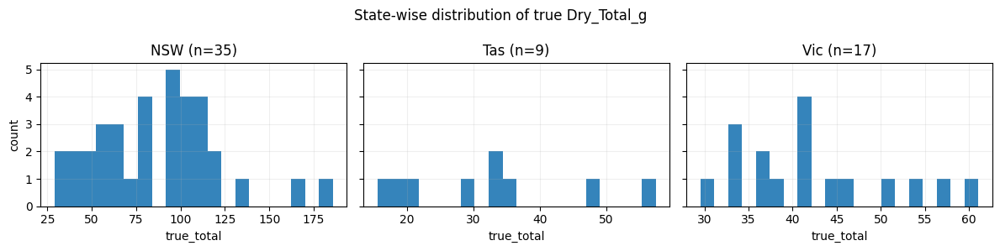

<Figure size 600x400 with 0 Axes>

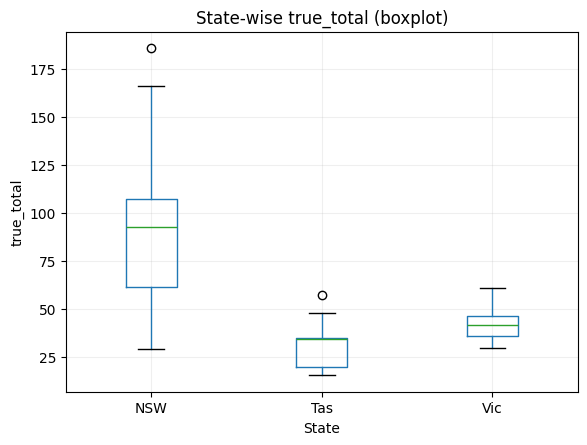


📌 Focus State='NSW'  n=35

🔥 NSW WORST 15（weighted_sse_img 大きい順）


,image_id,Sampling_Date,true_Dry_Total_g,pred_Dry_Total_g,err_Dry_Total_g,weighted_sse_img
39,ID384648061,2015/10/6,185.700012,87.968399,-97.731613,7645.109721
54,ID746335827,2015/10/6,166.099976,66.948494,-99.151482,6476.792654
3,ID1121692672,2015/2/24,111.200005,52.646801,-58.553204,2498.893919
17,ID1540480250,2015/2/24,120.400002,83.563271,-36.836731,2321.047734
20,ID157479394,2015/2/24,134.199966,110.591377,-23.608589,1154.896496
40,ID407646960,2015/2/25,107.500023,72.183411,-35.316612,1061.070867
21,ID162394992,2015/2/24,49.099998,84.894943,35.794945,967.098574
9,ID1357768767,2015/2/25,109.600014,90.078224,-19.521790,910.903280
36,ID353424190,2015/2/25,29.000002,68.559845,39.559843,890.026960
5,ID1211362607,2015/2/24,67.899986,65.634254,-2.265732,857.656134



📌 WORST群でのターゲット別 wSSE 合計（どれが支配的？）


,sum_wSSE



📌 State×total_bin の誤差テーブル
(14, 9)


/tmp/ipykernel_2873187/3098075046.py:239: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(_group_metrics)


,State,total_bin,n,true_total_median,mean_weighted_sse_img,sum_weighted_sse_img,MAE_total,RMSE_total,global_weighted_r2_in_group
0,NSW,"(15.509, 34.174]",2.0,29.850001,481.850547,963.701095,23.888736,28.570182,-3.619757
1,NSW,"(34.174, 41.6]",2.0,39.499998,147.000220,294.000439,11.254229,13.142899,0.154452
2,NSW,"(41.6, 56.4]",4.0,52.700003,484.435120,1937.740478,21.308277,24.669144,-0.350171
3,NSW,"(56.4, 80.2]",6.0,66.349991,276.448884,1658.693306,8.963743,10.678017,0.512676
4,NSW,"(80.2, 105.5]",11.0,94.799988,307.218574,3379.404316,11.702993,14.464040,0.735654
5,NSW,"(105.5, 185.7]",10.0,115.400013,2285.138267,22851.382671,39.249771,51.584829,0.107868
6,Tas,"(15.509, 34.174]",5.0,20.027597,84.539932,422.699662,10.066928,11.884344,0.052140
7,Tas,"(34.174, 41.6]",2.0,34.486099,64.426470,128.852940,10.138474,10.258261,0.563112
8,Tas,"(41.6, 56.4]",1.0,48.000908,176.191969,176.191969,12.625702,12.625702,0.275739
9,Tas,"(56.4, 80.2]",1.0,57.474102,112.914325,112.914325,13.293812,13.293812,0.678374



📌 (Pivot) mean_weighted_sse_img  ※高いほど悪い
(3, 6)


total_bin,"(15.509, 34.174]","(34.174, 41.6]","(41.6, 56.4]","(56.4, 80.2]","(80.2, 105.5]","(105.5, 185.7]"
State,,,,,,
NSW,481.850547,147.000220,484.435120,276.448884,307.218574,2285.138267
Tas,84.539932,64.426470,176.191969,112.914325,NaN,NaN
Vic,136.000320,94.979099,223.387723,345.129321,NaN,NaN



📌 (Pivot) n（各セルのサンプル数）
(3, 6)


total_bin,"(15.509, 34.174]","(34.174, 41.6]","(41.6, 56.4]","(56.4, 80.2]","(80.2, 105.5]","(105.5, 185.7]"
State,,,,,,
NSW,2.0,2.0,4.0,6.0,11.0,10.0
Tas,5.0,2.0,1.0,1.0,NaN,NaN
Vic,4.0,6.0,5.0,2.0,NaN,NaN



📌 (Pivot) global_weighted_r2_in_group  ※小さいほど悪い/ブレやすい
(3, 6)


total_bin,"(15.509, 34.174]","(34.174, 41.6]","(41.6, 56.4]","(56.4, 80.2]","(80.2, 105.5]","(105.5, 185.7]"
State,,,,,,
NSW,-3.619757,0.154452,-0.350171,0.512676,0.735654,0.107868
Tas,0.052140,0.563112,0.275739,0.678374,NaN,NaN
Vic,0.061762,0.410725,0.190836,0.138297,NaN,NaN


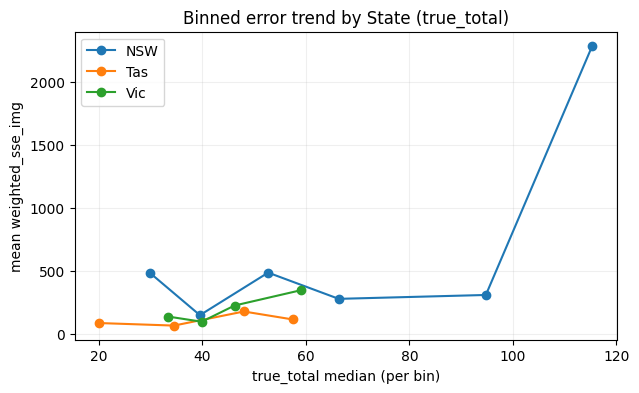

In [18]:
# ============================================================
# ✅ OOF診断（そのまま貼って実行OK）
#   1) State別 true_total 分布（要約 + 図）
#   2) NSW worst一覧（weighted_sse_img 上位）
#   3) State×true_total bin の誤差テーブル（count / mean / sum / global_r2）
# ============================================================
from typing import Dict, List, Optional

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- display() fallback（Colab/Kaggle/Jupyterで動く）----
try:
    from IPython.display import display
except Exception:
    display = print

# ---- 競技の global weighted R2（utilsが無い場合も動くfallback付き）----
try:
    from utils.metric import global_weighted_r2_score
except Exception:
    def global_weighted_r2_score(y_true: np.ndarray, y_pred: np.ndarray, weights: np.ndarray) -> float:
        """
        公式説明に合わせた "global weighted R²"（全(image,target)を1つにflattenして計算）
        R2 = 1 - Σ w*(y-ŷ)^2 / Σ w*(y-ȳ_w)^2
        """
        y_true = np.asarray(y_true, dtype=np.float64)
        y_pred = np.asarray(y_pred, dtype=np.float64)
        w = np.asarray(weights, dtype=np.float64)

        yt = y_true.reshape(-1)
        yp = y_pred.reshape(-1)
        ww = np.tile(w, y_true.shape[0]).reshape(-1)

        sse = np.sum(ww * (yt - yp) ** 2)
        mu = np.sum(ww * yt) / np.sum(ww)
        sst = np.sum(ww * (yt - mu) ** 2)
        return float(1.0 - sse / sst) if sst > 0 else 0.0


# ============================================================
# 🔧 Settings（必要ならここだけ変える）
# ============================================================
WORST_N = 15
N_BINS = 6
STATE_FOCUS = "NSW"  # worst確認したい州

# ============================================================
# ✅ 前提変数チェック
# ============================================================
required = ["cfg", "df_pivot", "ids", "preds", "targets"]
missing = [x for x in required if x not in globals()]
if missing:
    raise NameError(f"❌ Notebook内に必要な変数がありません: {missing}\n"
                    "先に cfg/df_pivot/ids/preds/targets を読み込むセルを実行してください。")

# target_cols / weights 取得（cfgの形揺れ対応）
target_cols: List[str] = list(cfg["target_cols"]) if isinstance(cfg, dict) else list(cfg.target_cols)

if isinstance(cfg, dict) and "metric" in cfg and isinstance(cfg["metric"], dict) and "weights" in cfg["metric"]:
    weights = np.array(cfg["metric"]["weights"], dtype=np.float64)
else:
    # fallback（あなたのコンペ設定）
    weights = np.array([0.1, 0.1, 0.1, 0.2, 0.5], dtype=np.float64)

print("✅ target_cols:", target_cols)
print("✅ weights    :", weights)

# ============================================================
# ✅ df_all を作る（無ければ自動作成）
# ============================================================
if "df_all" not in globals():
    # --- OOF配列 -> DataFrame（pred/true/err） ---
    oof_df = pd.DataFrame({"image_id": np.asarray(ids).astype(str)})
    for j, t in enumerate(target_cols):
        oof_df[f"pred_{t}"] = np.asarray(preds)[:, j].astype(np.float64)
        oof_df[f"true_{t}"] = np.asarray(targets)[:, j].astype(np.float64)
        oof_df[f"err_{t}"]  = oof_df[f"pred_{t}"] - oof_df[f"true_{t}"]

    # --- meta結合（polars -> pandas）---
    meta_cols = ["image_id", "image_path", "State", "Sampling_Date", "Species"]
    meta_cols = [c for c in meta_cols if c in df_pivot.columns]
    df_meta = df_pivot.select(meta_cols).to_pandas()

    df_all = oof_df.merge(df_meta, on="image_id", how="left")

    # --- weighted_sse_img を追加（画像単位の重み付き二乗誤差）---
    wsse_img = np.zeros(len(df_all), dtype=np.float64)
    for j, t in enumerate(target_cols):
        e = df_all[f"err_{t}"].values.astype(np.float64)
        df_all[f"sse_{t}"] = e ** 2
        df_all[f"wsse_{t}"] = weights[j] * (e ** 2)
        wsse_img += df_all[f"wsse_{t}"].values
    df_all["weighted_sse_img"] = wsse_img

print("✅ df_all shape:", df_all.shape)
show_df(df_all)


# ============================================================
# 0) 全体スコア確認（このfoldのOOFに対するglobal）
# ============================================================
y_true_all = df_all[[f"true_{t}" for t in target_cols]].values
y_pred_all = df_all[[f"pred_{t}" for t in target_cols]].values
global_r2_all = global_weighted_r2_score(y_true_all, y_pred_all, weights)
print(f"\n📌 Global weighted R2 (OOF overall): {global_r2_all:.6f}")


# ============================================================
# 1) State別 true_total 分布（要約 + 図）
# ============================================================
TOTAL_T = "Dry_Total_g"
true_total_col = f"true_{TOTAL_T}"
pred_total_col = f"pred_{TOTAL_T}"
err_total_col  = f"err_{TOTAL_T}"

if true_total_col not in df_all.columns:
    raise KeyError(f"❌ {true_total_col} が df_all にありません。target_cols に {TOTAL_T} があるか確認してください。")

def _q(p: float):
    return lambda x: float(np.quantile(x, p))

state_total_summary = (
    df_all.groupby("State")[true_total_col]
    .agg(
        n="count",
        mean="mean",
        median="median",
        p75=_q(0.75),
        p90=_q(0.90),
        p95=_q(0.95),
        max="max",
        min="min",
    )
    .reset_index()
    .sort_values("median")
)

print("\n📌 State別 true_total 分布サマリ（median順）")
show_df(state_total_summary, 10)

# --- 図：State別ヒストグラム（true_total）---
states = [s for s in sorted(df_all["State"].dropna().unique())]
fig, axes = plt.subplots(1, len(states), figsize=(4 * len(states), 3), sharey=True)
if len(states) == 1:
    axes = [axes]

for ax, st in zip(axes, states):
    x = df_all.loc[df_all["State"] == st, true_total_col].values
    ax.hist(x, bins=20, alpha=0.9)
    ax.set_title(f"{st} (n={len(x)})")
    ax.set_xlabel("true_total")
    ax.grid(True, alpha=0.2)

axes[0].set_ylabel("count")
plt.suptitle("State-wise distribution of true Dry_Total_g")
plt.tight_layout()
plt.show()

# --- 図：State別箱ひげ（true_total）---
plt.figure(figsize=(6, 4))
df_all.boxplot(column=true_total_col, by="State")
plt.title("State-wise true_total (boxplot)")
plt.suptitle("")  # pandasが付ける余計なタイトル消し
plt.ylabel("true_total")
plt.grid(True, alpha=0.2)
plt.show()


# ============================================================
# 2) NSW（など特定State）の worst 一覧
# ============================================================
if "State" not in df_all.columns:
    print("[WARN] State列が無いので、State別分析はスキップします。")
else:
    df_focus = df_all[df_all["State"] == STATE_FOCUS].copy()
    print(f"\n📌 Focus State='{STATE_FOCUS}'  n={len(df_focus)}")

    if len(df_focus) == 0:
        print(f"[WARN] {STATE_FOCUS} が df_all に存在しません。")
    else:
        worst = df_focus.sort_values("weighted_sse_img", ascending=False).head(WORST_N)

        cols_show = [
            "image_id",
            "image_path" if "image_path" in worst.columns else None,
            "Sampling_Date" if "Sampling_Date" in worst.columns else None,
            "Species" if "Species" in worst.columns else None,
            true_total_col,
            pred_total_col,
            err_total_col,
            "weighted_sse_img",
        ]
        cols_show = [c for c in cols_show if c is not None]

        print(f"\n🔥 {STATE_FOCUS} WORST {WORST_N}（weighted_sse_img 大きい順）")
        display(worst[cols_show])

        # ついでに：worstのターゲット別 wsse を合計して「何が効いているか」見る
        wsse_cols = [f"wsse_{t}" for t in target_cols if f"wsse_{t}" in worst.columns]
        contrib = worst[wsse_cols].sum().sort_values(ascending=False)
        contrib.index = [c.replace("wsse_", "") for c in contrib.index]
        print("\n📌 WORST群でのターゲット別 wSSE 合計（どれが支配的？）")
        display(contrib.to_frame("sum_wSSE"))


# ============================================================
# 3) State × true_total bin の誤差テーブル
#    - count
#    - mean/sum weighted_sse_img
#    - totalのMAE/RMSE
#    - bin内 global_weighted_r2
# ============================================================
df_bins = df_all.copy()
df_bins["total_bin"] = pd.qcut(df_bins[true_total_col], q=N_BINS, duplicates="drop")

def _group_metrics(g: pd.DataFrame) -> pd.Series:
    y_true = g[[f"true_{t}" for t in target_cols]].values
    y_pred = g[[f"pred_{t}" for t in target_cols]].values
    r2 = global_weighted_r2_score(y_true, y_pred, weights)

    e_total = (g[pred_total_col].values - g[true_total_col].values).astype(np.float64)
    mae_total = float(np.mean(np.abs(e_total)))
    rmse_total = float(np.sqrt(np.mean(e_total ** 2)))

    return pd.Series({
        "n": len(g),
        "true_total_median": float(g[true_total_col].median()),
        "mean_weighted_sse_img": float(g["weighted_sse_img"].mean()),
        "sum_weighted_sse_img": float(g["weighted_sse_img"].sum()),
        "MAE_total": mae_total,
        "RMSE_total": rmse_total,
        "global_weighted_r2_in_group": float(r2),
    })

state_bin_df = (
    df_bins.groupby(["State", "total_bin"], observed=True)
    .apply(_group_metrics)
    .reset_index()
    .sort_values(["State", "true_total_median"])
)

print("\n📌 State×total_bin の誤差テーブル")
show_df(state_bin_df, 10)

print("\n📌 (Pivot) mean_weighted_sse_img  ※高いほど悪い")
pivot_mean = state_bin_df.pivot(index="State", columns="total_bin", values="mean_weighted_sse_img")
show_df(pivot_mean, 10)

print("\n📌 (Pivot) n（各セルのサンプル数）")
pivot_n = state_bin_df.pivot(index="State", columns="total_bin", values="n")
show_df(pivot_n, 10)

print("\n📌 (Pivot) global_weighted_r2_in_group  ※小さいほど悪い/ブレやすい")
pivot_r2 = state_bin_df.pivot(index="State", columns="total_bin", values="global_weighted_r2_in_group")
show_df(pivot_r2, 10)

# --- 図：各Stateのbinごとの mean_weighted_sse_img の推移 ---
plt.figure(figsize=(7, 4))
for st in sorted(state_bin_df["State"].dropna().unique()):
    g = state_bin_df[state_bin_df["State"] == st].sort_values("true_total_median")
    plt.plot(g["true_total_median"].values, g["mean_weighted_sse_img"].values, marker="o", label=str(st))
plt.xlabel("true_total median (per bin)")
plt.ylabel("mean weighted_sse_img")
plt.title("Binned error trend by State (true_total)")
plt.grid(True, alpha=0.2)
plt.legend()
plt.show()